# Desafío Final - Modelo de Clasificación sobre riesgo de créditos a clientes

## Setup

In [ ]:
# Instalación de bibliotecas necesarias
! pip install pandas-profiling==2.7.1 --quiet
! pip install lime --quiet

In [ ]:
# Importamos Bibliotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import warnings
import pandas_profiling
import lime

from scipy import stats
from datetime import datetime, date
from lime import lime_tabular
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, Ridge, Lasso, ElasticNet
from sklearn.feature_selection import RFE, RFECV
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score, confusion_matrix, plot_confusion_matrix, plot_roc_curve, accuracy_score, precision_score, recall_score, f1_score
from imblearn.combine import SMOTEENN 
from imblearn.over_sampling import SMOTENC
from imblearn.over_sampling import SMOTE
from sklearn import tree
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

# Ignoramos warnings
warnings.filterwarnings('ignore')

# Seteamos tema de seaborn para gráficos
sns.set_theme(style="whitegrid")

In [ ]:
# Leemos los datos
creditos_dataset = pd.read_csv('https://drive.google.com/uc?export=download&id=1K8WC3hSLSyGpZkuWVLj5TXs_-8UiZef8', sep=';')
sucursales_dataset = pd.read_csv("https://docs.google.com/spreadsheets/d/e/2PACX-1vQW3qTIuoU5p0W8IRsd86g1N715wNxC-QnFjCEgn5D1sX5HOAdpPmcMNOlP43yNLg/pub?output=csv")

## Preprocesamiento

In [ ]:
# Visualizamos conjunto de datos de créditos
print(creditos_dataset.shape)
creditos_dataset.head(5)

(139689, 49)


,IDCLIENTE,SEXO,NACIMIENTO,ANTIGUEDAD_LABORAL,NRO_FACILITADOR,FECHA_INICIO,PREVENTA_AX,PREVENTA_COGNOS,FACTURA_AX,SUCURSAL,...,SALDO_GARANTE,LIBRE_DEUDA,RUBRO_PRODUCTO,SCORE_VERAZ,FECHA_VERAZ,MESES,NroCuota,AtrasoActualCuota,MaxAtrasoEnFactura,NroFactura
0,30952319629828,F,1968-05-21,276.0,1088749,2019-01-02,PDV-002422007,1002422007,FVB0530-00015514,91,...,0.0,SI,MOTO,1,1900-01-01,32,0,0,72,2053000015514
1,40221350629388,M,1978-02-03,225.0,1087907,2019-01-02,PDV-002418601,1002418601,FVB0514-00027378,78,...,0.0,SI,OTROS,1,1900-01-01,32,0,0,58,2051400027378
2,41212743968700,M,1975-06-11,84.0,1087745,2019-01-02,PDV-002417917,1002417917,FVB0554-00024964,38,...,0.0,NO APLICA,OTROS,1,1900-01-01,32,0,0,31,2055400024964
3,54380592225224,M,1992-04-06,56.0,1087953,2019-01-02,PDV-002418826,1002418826,FVB0167-00074583,40,...,0.0,SI,OTROS,1,1900-01-01,32,0,0,32,2016700074583
4,57777174098268,M,1993-10-17,54.0,1088370,2019-01-02,PDV-002420637,1002420637,FVB0167-00074596,40,...,0.0,SI,OTROS,3,1900-01-01,32,11,686,47,2016700074596


In [ ]:
# Visualizamos conjunto de datos de sucursales
print(sucursales_dataset.shape)
sucursales_dataset.head(5)

(95, 6)


,Sucursal,Desc_Suc,Zona,Localidad,Provincia,TipoLocalidad
0,0,Outlet,OUTLET,Resistencia,Chaco,Capital
1,2,Tres Isletas,NEA,Tres Isletas,Chaco,Interior
2,3,Quitilipi,NEA,Quitilipi,Chaco,Interior
3,4,Saenz Peña,NEA,Presidencia Roque Saenz Peña,Chaco,Interior
4,5,Rcia. - 9 de julio,NEA,Resistencia,Chaco,Capital


In [ ]:
# Vemos los tipos de datos de créditos
creditos_dataset.dtypes

IDCLIENTE                   int64
SEXO                       object
NACIMIENTO                 object
ANTIGUEDAD_LABORAL        float64
NRO_FACILITADOR             int64
FECHA_INICIO               object
PREVENTA_AX                object
PREVENTA_COGNOS             int64
FACTURA_AX                 object
SUCURSAL                   object
AUTORIZADOR                object
CANT_OBS_BA                 int64
CANT_OBS_BC                 int64
REGLA_ID                   object
REGLA_DESCRIPCION          object
RUBRO_LABORAL              object
ACTIVIDAD_LABORAL          object
AREA_LABORAL               object
TIPO_CONTRATO              object
SUELDO                    float64
LIM_SOLA_FIRMA            float64
MAX_ENDEU                 float64
MONTO_OP                  float64
COEF_DE_LTE_SOLA_FIRMA    float64
COEF_DE_MAX_ENDEU         float64
OTROS_CREDITOS            float64
RESULT_DE_REGLAS           object
REQUIERE_GARANTE           object
FEC_EVAL                   object
TIPO_CREDITO  

In [ ]:
# Vemos los tipos de datos de sucursales
sucursales_dataset.dtypes

Sucursal          int64
Desc_Suc         object
Zona             object
Localidad        object
Provincia        object
TipoLocalidad    object
dtype: object

In [ ]:
# Transformamos a datetime las columnas que son str pero que representan fechas
columnas_fechas=['NACIMIENTO','FECHA_INICIO','FEC_EVAL','FECHA_VERAZ']
for c in columnas_fechas:
    creditos_dataset[c]=pd.to_datetime(creditos_dataset[c])

In [ ]:
# Observamos los registros nulos en conjunto de datos de créditos
creditos_dataset.isnull().sum() / creditos_dataset.shape[0]

IDCLIENTE                 0.000000
SEXO                      0.000415
NACIMIENTO                0.000000
ANTIGUEDAD_LABORAL        0.000036
NRO_FACILITADOR           0.000000
FECHA_INICIO              0.000000
PREVENTA_AX               0.000000
PREVENTA_COGNOS           0.000000
FACTURA_AX                0.001954
SUCURSAL                  0.000000
AUTORIZADOR               0.000000
CANT_OBS_BA               0.000000
CANT_OBS_BC               0.000000
REGLA_ID                  0.000000
REGLA_DESCRIPCION         0.000000
RUBRO_LABORAL             0.000000
ACTIVIDAD_LABORAL         0.000000
AREA_LABORAL              0.000000
TIPO_CONTRATO             0.000000
SUELDO                    0.000000
LIM_SOLA_FIRMA            0.000000
MAX_ENDEU                 0.000000
MONTO_OP                  0.000000
COEF_DE_LTE_SOLA_FIRMA    0.000000
COEF_DE_MAX_ENDEU         0.000000
OTROS_CREDITOS            0.000000
RESULT_DE_REGLAS          0.000000
REQUIERE_GARANTE          0.000000
FEC_EVAL            

Prácticamente no tenemos valores nulos (igualmente, procedemos a eliminar la fila que contenga algún N/A)

In [ ]:
creditos_dataset.dropna(axis = 0, how='any', inplace=True)
creditos_dataset.shape

(139310, 49)

In [ ]:
# Observamos los registros nulos en sucursales
sucursales_dataset.isnull().sum() / sucursales_dataset.shape[0]

Sucursal         0.0
Desc_Suc         0.0
Zona             0.0
Localidad        0.0
Provincia        0.0
TipoLocalidad    0.0
dtype: float64

## Agrupamiento de clientes por edad y discretización

In [ ]:
# Calculamos la edad en función de la fecha de compra y generamos una nueva columna
creditos_dataset['EDAD'] = creditos_dataset.apply(lambda x: x.FECHA_INICIO.year - x.NACIMIENTO.year - \
                           ((x.FECHA_INICIO.month, x.FECHA_INICIO.day) < (x.NACIMIENTO.month, x.NACIMIENTO.day)), axis=1)

In [ ]:
# Dropeamos los registros donde está mal cargada la edad del cliente, menores de 18 y mayores de 80 (edades no permitidas para otorgar un crédito)
creditos_dataset.drop(creditos_dataset[creditos_dataset['EDAD'] < 18].index, inplace=True)
creditos_dataset.drop(creditos_dataset[creditos_dataset['EDAD'] > 80].index, inplace=True)

Ensayemos un histograma para obervar la distribución de nuestros datos por EDAD y SEXO:

<AxesSubplot:xlabel='EDAD', ylabel='Count'>

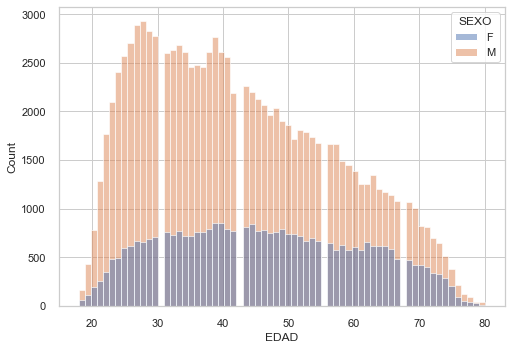

In [ ]:
sns.histplot(creditos_dataset, x=creditos_dataset['EDAD'], hue=creditos_dataset['SEXO'])

In [ ]:
# Clasificamos una nueva variable con los clientes por rangos de edad (10 grupos del mismo tamaño) que luego facilite su utilización como variable explicativa
Rangos_Edades = pd.qcut(creditos_dataset['EDAD'], 10).value_counts()
print(Rangos_Edades)
creditos_dataset['Bin.Edad'] = pd.qcut(creditos_dataset['EDAD'], 10, labels=False)

(29.0, 34.0]      16991
(42.0, 47.0]      14574
(17.999, 25.0]    14029
(25.0, 29.0]      13978
(52.0, 58.0]      13903
(38.0, 42.0]      13396
(58.0, 65.0]      13331
(47.0, 52.0]      13055
(34.0, 38.0]      13029
(65.0, 80.0]      12796
Name: EDAD, dtype: int64


In [ ]:
creditos_dataset['Bin.Edad'].value_counts()

2    16991
5    14574
0    14029
1    13978
7    13903
4    13396
8    13331
6    13055
3    13029
9    12796
Name: Bin.Edad, dtype: int64

M    103966
F     35116
Name: SEXO, dtype: int64


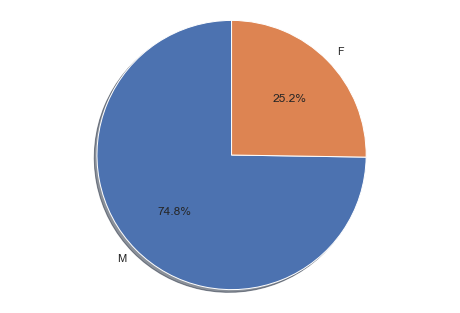

In [ ]:
# Verificamos la variable Sexo y la graficamos con un Pie Chart

print(creditos_dataset['SEXO'].value_counts())

labels = 'M', 'F'
sizes = creditos_dataset['SEXO'].value_counts()

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  

plt.show()

Volvemos a graficar el histograma con los rangos de edad:

<AxesSubplot:xlabel='Bin.Edad', ylabel='Count'>

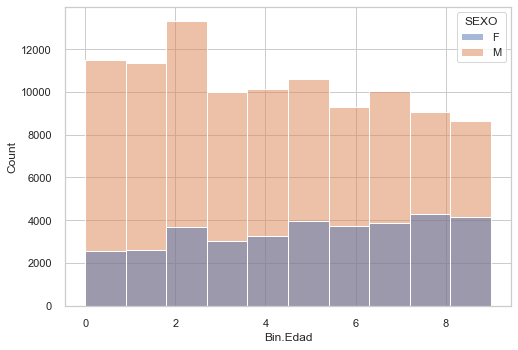

In [ ]:
sns.histplot(creditos_dataset, x=creditos_dataset['Bin.Edad'], hue=creditos_dataset['SEXO'], bins=10)

## Clasificación de datos laborales

#### Exploremos y grafiquemos features relacionadas con datos laborales:

### Rubro Laboral

In [ ]:
creditos_dataset['RUBRO_LABORAL'].unique()

array(['Relacion dependencia', 'Pasivo', 'Excepcion', 'Independiente',
       'Excepcion motos', 'Titular Tarjeta de Creditos', 'Cobro Judicial'],
      dtype=object)

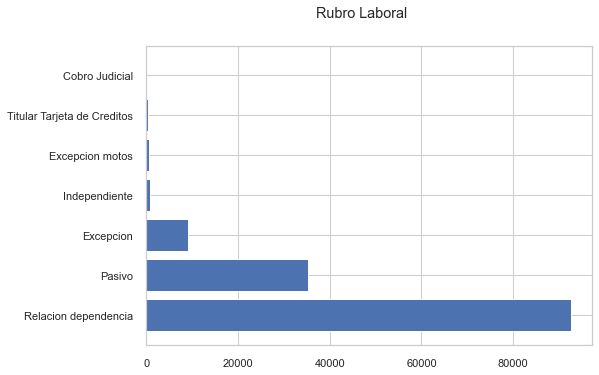

In [ ]:
fig, ax = plt.subplots()
names=creditos_dataset['RUBRO_LABORAL'].unique()
ax.barh(names, creditos_dataset['RUBRO_LABORAL'].value_counts())
fig.suptitle('Rubro Laboral')
fig.show()

### Actividad Laboral

In [ ]:
creditos_dataset['ACTIVIDAD_LABORAL'].unique()

array(['Publico', 'Privado', 'Jubilado con Aportes', 'Pension M 7 Hijos',
       'Pension por Invalidez', 'Pension por Viudez', 'No Aplica',
       'Monotributista', 'Jubilado sin Aportes',
       'Pension por Fallecimiento/Padre/Madre', 'Pension Excombatiente',
       'Publico Provincial', 'Responsable Inscripto',
       'Pension Madre Soltera', 'Relacion de Dependencia',
       'Independiente', 'Sociedad (SA/SRL)'], dtype=object)

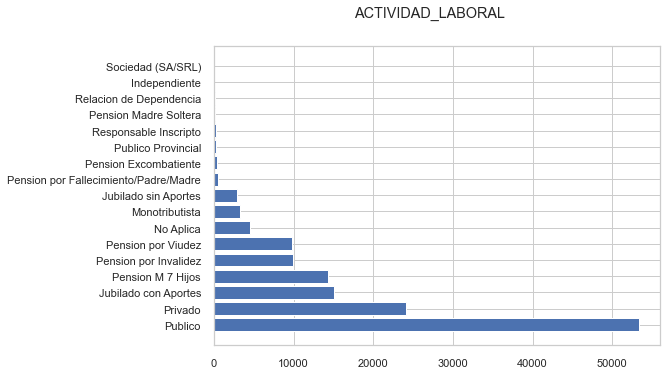

In [ ]:
fig, ax = plt.subplots()
names=creditos_dataset['ACTIVIDAD_LABORAL'].unique()
ax.barh(names,creditos_dataset['ACTIVIDAD_LABORAL'].value_counts())
fig.suptitle('ACTIVIDAD_LABORAL')
fig.show()

### Area Laboral

In [ ]:
creditos_dataset['AREA_LABORAL'].unique()


array(['Municipal', 'Administracion', 'Ejercito', 'Otros', 'No Aplica',
       'Policia', 'Docente', 'Rural', 'Gendarme', 'Construcción',
       'CAT. B - C', 'Empleada Domestica', 'Privados', 'Nacionales',
       'Poder Judicial', 'Industrial', 'Transporte', 'Embarcadizo',
       'Comercio', 'Provinciales', 'CAT. F - G', 'Gastronómico-Hotel',
       'CAT. D - E', 'Comercio 1 Línea', 'CAT. H - I - J - K - L',
       'Bombero', 'Energía-Cooperativas', 'Administración',
       'Policía-Bombero', 'Bancos-Financieras', 'Minería-Canteras'],
      dtype=object)

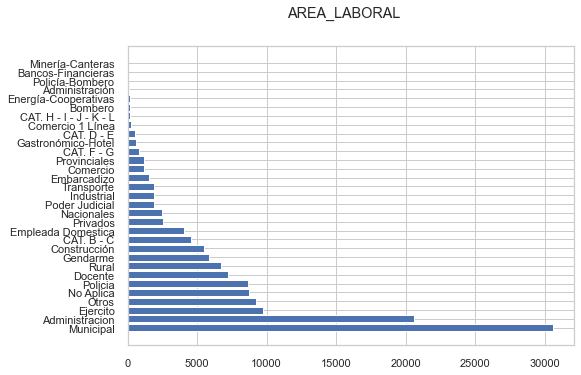

In [ ]:
fig, ax = plt.subplots()
names=creditos_dataset['AREA_LABORAL'].unique()
ax.barh(names,creditos_dataset['AREA_LABORAL'].value_counts())
fig.suptitle('AREA_LABORAL')
fig.show()

### Tipo de contrato

In [ ]:
creditos_dataset['TIPO_CONTRATO'].unique()

array(['Planta', 'Voluntario', 'No Aplica', 'Contratado', 'Jornalizado',
       'Rural', 'Cadete'], dtype=object)

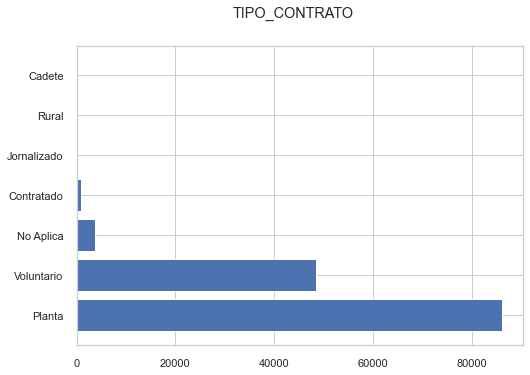

In [ ]:
fig, ax = plt.subplots()
names=creditos_dataset['TIPO_CONTRATO'].unique()
ax.barh(names,creditos_dataset['TIPO_CONTRATO'].value_counts())
fig.suptitle('TIPO_CONTRATO')
fig.show()

## Tipo y modalidad de crédito personal

In [ ]:
# Determina si el cliente es nuevo o no
creditos_dataset['TIPO_CREDITO'].value_counts()

Solo compra con carpeta al dia       100613
Apertura con compra en el momento     33787
Compra con renovacion de carpeta       4682
Name: TIPO_CREDITO, dtype: int64

In [ ]:
# Tipos de créditos personales disponibles
creditos_dataset['MODALIDAD_CREDITO'].value_counts()

Cuota al Dia      92171
Cuota Diferida    37364
Con Adelanto       9547
Name: MODALIDAD_CREDITO, dtype: int64

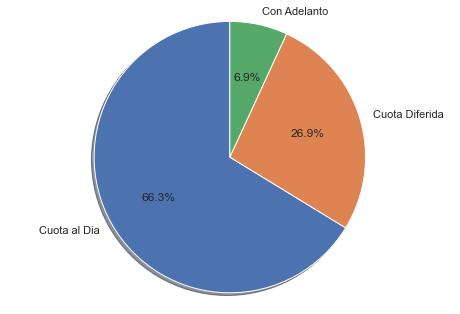

In [ ]:
labels = creditos_dataset['MODALIDAD_CREDITO'].unique()
sizes = creditos_dataset['MODALIDAD_CREDITO'].value_counts()

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [ ]:
# Cantidad de cuotas posibles para un credito >=2 y <=24
creditos_dataset['CANT_CUOTAS'].value_counts()

12    61417
18    30458
24    16044
15     7485
10     4400
6      4245
3      3437
2      3176
21     3015
4      1611
13      542
11      537
20      499
5       359
14      315
8       285
16      284
17      258
1       217
19      199
7        95
22       76
30       68
23       57
29        1
25        1
27        1
Name: CANT_CUOTAS, dtype: int64

In [ ]:
# Dropeamos CANT_CUOTAS <2 y >24
creditos_dataset.drop(creditos_dataset[creditos_dataset['CANT_CUOTAS'] < 2].index, inplace=True)
creditos_dataset.drop(creditos_dataset[creditos_dataset['CANT_CUOTAS'] > 24].index, inplace=True)

In [ ]:
#Graficamos la distribución de la feature 'Cantidad de Cuotas'
#previamente definimos una función para utilizar en distintas distribuciones a graficar

def distribution_plotter(data, label, binrange=500, bin_width=10):    
    sns.set(rc={"figure.figsize": (14, 7)})
    sns.set_style("white")    
    dist = sns.histplot(data, stat = 'count', kde = False, 
                        line_kws = {'linewidth':10}, 
                        binwidth = bin_width, binrange = (0,binrange))    
    dist.set_title('Distribución ' + label + '\n', fontsize = 16)

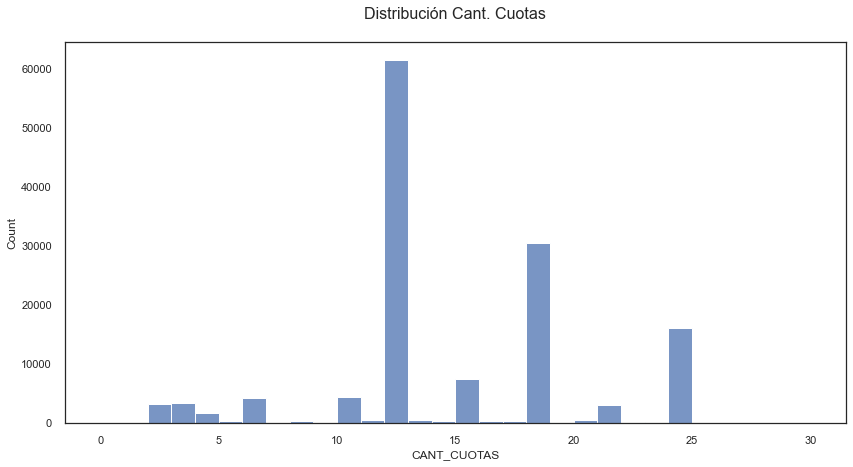

In [ ]:
distribution_plotter(creditos_dataset['CANT_CUOTAS'],'Cant. Cuotas',binrange=30,bin_width=1)

## Discretización de la variable sueldo

In [ ]:
# Examinamos posibles outliers de la variable Sueldo
creditos_dataset['SUELDO'][creditos_dataset['SUELDO']>250000].value_counts()

362810.45    3
999999.00    1
320410.23    1
379228.00    1
308800.00    1
346502.00    1
257930.50    1
251970.00    1
307540.00    1
277910.52    1
373970.00    1
264449.00    1
384000.00    1
370160.00    1
Name: SUELDO, dtype: int64

In [ ]:
# Dropeamos sueldos menores a $5000 (mínimo para solicitar un crédito) y otros outliers encontrados
creditos_dataset.drop(creditos_dataset[creditos_dataset['SUELDO'] < 5000].index, inplace=True)
creditos_dataset.drop(creditos_dataset[creditos_dataset['SUELDO'] > 300000].index, inplace=True)

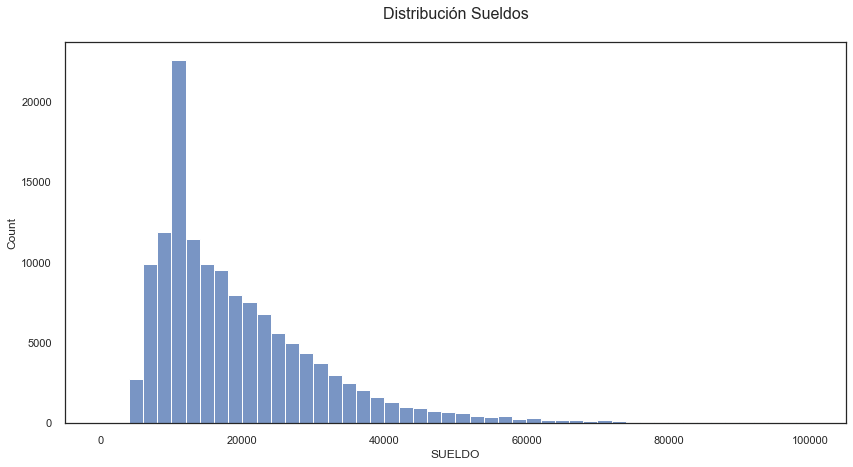

In [ ]:
# Graficamos la variable previo a la discretización:
distribution_plotter(creditos_dataset['SUELDO'], 'Sueldos',binrange=100000,bin_width=2000)

In [ ]:
# Creamos función para binarizar variable SUELDO en rangos de $5000

def binarize_credit_sueldo(df_column):
  df_column_binarized = []

  for value in df_column:
        
    for rango in range(5000,300000,5000):
        if (rango <= value):
            continue
        df_column_binarized.append(rango)
        break
    

  return df_column_binarized

# Binarizamos la variable
creditos_dataset['RANGO_SUELDO'] = binarize_credit_sueldo(creditos_dataset['SUELDO'])

In [ ]:
creditos_dataset['RANGO_SUELDO'].value_counts()

15000     38461
10000     24468
20000     22854
25000     17012
30000     12129
35000      8031
40000      4760
45000      2700
50000      1963
55000      1270
60000       865
65000       582
70000       390
75000       334
80000       163
85000       148
90000       103
95000        83
100000       78
105000       39
115000       38
110000       27
125000       25
130000       15
120000       12
135000       12
170000       10
140000        9
150000        5
205000        4
180000        4
145000        4
155000        3
160000        3
230000        3
255000        2
195000        2
250000        2
215000        2
165000        2
235000        2
185000        2
280000        1
190000        1
265000        1
260000        1
220000        1
225000        1
Name: RANGO_SUELDO, dtype: int64

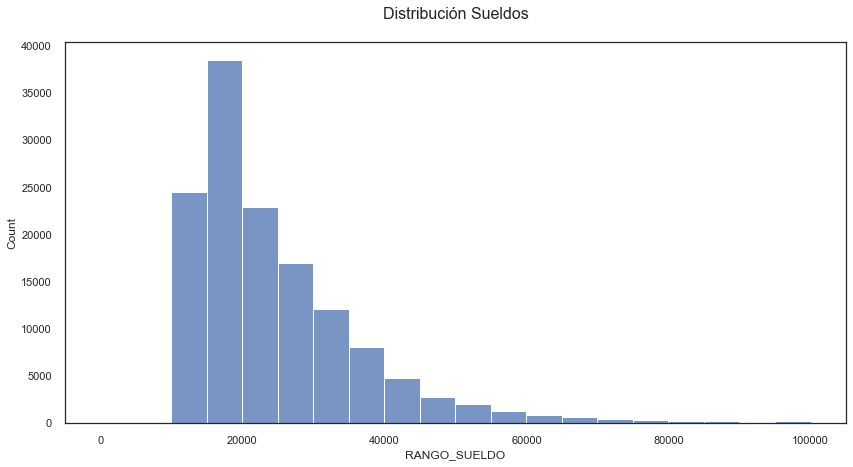

In [ ]:
# Distribución de Sueldos luego de discretizar
distribution_plotter(creditos_dataset['RANGO_SUELDO'],'Sueldos',binrange=100000,bin_width=5000)

In [ ]:
# En esta instancia la idea es unir ambos datasets a través del código de la sucursal. Veamos los valores únicos de ambas columnas:
print(creditos_dataset['SUCURSAL'].value_counts())
print(sucursales_dataset['Sucursal'].value_counts())

016    4078
042    3880
006    3432
078    3212
033    3177
       ... 
75       16
62       14
A_C      14
ARR       3
000       1
Name: SUCURSAL, Length: 155, dtype: int64
95    1
36    1
27    1
28    1
29    1
     ..
73    1
74    1
75    1
77    1
0     1
Name: Sucursal, Length: 95, dtype: int64


In [ ]:
creditos_dataset['SUCURSAL'].unique()

array([91, 78, 38, 40, 81, 42, 35, 30, 36, 32, 44, 28, 16, 31, 54, 22, 39,
       69, 8, 58, 93, 96, 84, 24, 37, 70, 57, 67, 15, 90, 29, 13, 33, 19,
       86, 21, 17, 85, 74, 34, 23, 59, 68, 20, 41, 79, 95, 18, 108, 92,
       89, 45, 107, 110, 88, 99, 109, 43, 60, 75, 83, 46, 62, 77, '054',
       '093', '035', '032', '042', '095', '039', '044', '031', '028',
       '016', '078', '041', '067', '079', '090', '033', '030', '013',
       '036', '008', '022', '037', '059', '038', '057', '018', '110',
       '034', '092', '024', '029', '015', '017', '088', '085', '069',
       '045', '058', '099', '077', '091', '068', '081', '086', '109',
       '043', '040', '070', '108', '084', '062', '023', '021', '019',
       '089', '020', '074', '046', '083', '107', '075', '096', '060',
       'ARR', '047', '052', '048', '056', '049', '082', '050', '055',
       '073', '051', '003', '004', '002', '053', '010', '012', '006',
       '007', '014', '005', '026', '027', '025', '112', 'A_C', '000'],
     

In [ ]:
# Ya habíamos observado que los tipos de datos no coincidían, además de tener casos que no presentaban un código numérico (Veamos éstos últimos) 
codnonum = creditos_dataset[creditos_dataset['SUCURSAL'].isin(['A_C','ARR', 'ORT'])]
codnonum

,IDCLIENTE,SEXO,NACIMIENTO,ANTIGUEDAD_LABORAL,NRO_FACILITADOR,FECHA_INICIO,PREVENTA_AX,PREVENTA_COGNOS,FACTURA_AX,SUCURSAL,...,SCORE_VERAZ,FECHA_VERAZ,MESES,NroCuota,AtrasoActualCuota,MaxAtrasoEnFactura,NroFactura,EDAD,Bin.Edad,RANGO_SUELDO
22701,59493941394716,F,1995-08-11,57.0,1184593,2019-04-06,PDV-002877328,1002877328,FVB0514-00030545,ARR,...,503,1900-01-01,29,3,830,24,2051400030545,23,0,20000
25422,51364164864824,M,1989-02-28,45.0,1199696,2019-04-20,PDV-002944176,1002944176,FVB0177-00068663,ARR,...,51,1900-01-01,29,5,729,40,2017700068663,30,2,10000
70322,53463357103112,F,1990-04-11,35.0,1414379,2019-10-17,PDV-003997732,1003997732,FVB0475-00028759,ARR,...,62,2019-10-17,23,5,579,0,2047500028759,29,1,15000
74086,63389606546760,M,1999-01-07,22.0,1435088,2019-11-01,PDV-004086302,1004086302,FVB0183-00070757,A_C,...,271,2021-04-15,22,0,0,174,2018300070757,20,0,35000
78394,17503541164376,M,1955-04-02,410.0,1454132,2019-11-15,PDV-004204382,1004204382,FVB0181-00062039,A_C,...,777,1900-01-01,22,0,0,29,2018100062039,64,8,15000
93607,45264557089252,M,1982-10-24,40.0,1523832,2019-12-28,PDV-004509367,1004509367,FVB0165-00085853,A_C,...,225,2021-05-04,21,0,0,51,2016500085853,37,3,40000
96127,63008780498720,F,1998-10-14,44.0,1533291,2020-01-04,PDV-004551500,1004551500,FVB0513-00039692,A_C,...,396,2020-01-04,20,0,0,33,2051300039692,21,0,10000
102723,17385940241252,F,1955-02-23,177.0,1564896,2020-01-22,PDV-004700611,1004700611,FVB0007-00071410,A_C,...,64,2021-06-17,20,0,0,0,2000700071410,64,8,10000
105228,64450510651960,F,2000-02-11,12.0,1580314,2020-02-01,PDV-004762897,1004762897,FVB0618-00006899,A_C,...,468,2021-06-04,19,0,0,85,2061800006899,19,0,10000
112575,28382760245188,F,1967-10-28,119.0,1624664,2020-03-03,PDV-004973338,1004973338,0000000405038,A_C,...,348,2020-03-02,18,0,0,0,2017300079008,52,6,25000


In [ ]:
# Extraemos los índices y borramos los registros
creditos_dataset.drop(index=codnonum.index,inplace=True)
creditos_dataset.shape

(136610, 52)

In [ ]:
# Homogeneizamos los dtypes
creditos_dataset['SUCURSAL'] = pd.to_numeric(creditos_dataset['SUCURSAL'])

In [ ]:
creditos_dataset['SUCURSAL'].unique()

array([ 91,  78,  38,  40,  81,  42,  35,  30,  36,  32,  44,  28,  16,
        31,  54,  22,  39,  69,   8,  58,  93,  96,  84,  24,  37,  70,
        57,  67,  15,  90,  29,  13,  33,  19,  86,  21,  17,  85,  74,
        34,  23,  59,  68,  20,  41,  79,  95,  18, 108,  92,  89,  45,
       107, 110,  88,  99, 109,  43,  60,  75,  83,  46,  62,  77,  47,
        52,  48,  56,  49,  82,  50,  55,  73,  51,   3,   4,   2,  53,
        10,  12,   6,   7,  14,   5,  26,  27,  25, 112,   0], dtype=int64)

In [ ]:
# Chequeemos que una columna esté contenida en la otra
creditos_dataset['SUCURSAL'].apply(lambda x: x not in sucursales_dataset['Sucursal'].unique()).sum()

0

Unificamos las dos tablas a través de 'Sucursal' con el método merge

In [ ]:
data = pd.merge(left=creditos_dataset, right=sucursales_dataset, how='left', left_on='SUCURSAL', right_on='Sucursal')

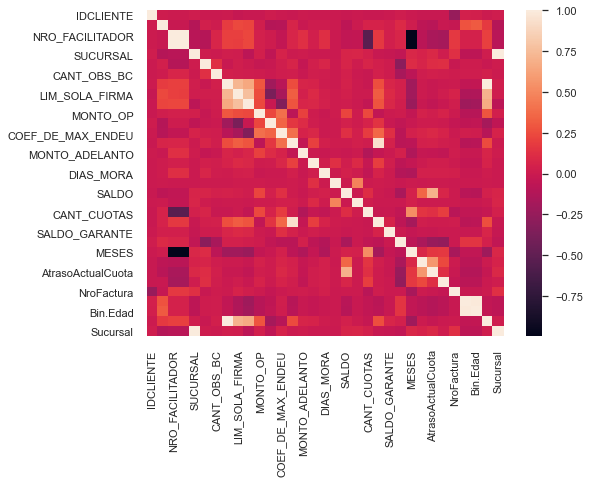

In [ ]:
# Aproximemos un primer gráfico de correlaciones
datacorr=data.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(datacorr)
plt.show()

A los fines de evitar problemas de dimensionalidad, según las correlaciones graficadas y en función al tipo de modelo que se pretende trabajar, procedemos a eliminar features que entendemos no aportan al análisis perseguido. 

In [ ]:
column_drop=['NRO_FACILITADOR','FECHA_INICIO','PREVENTA_AX','PREVENTA_COGNOS','FACTURA_AX','REGLA_DESCRIPCION','AUTORIZADOR',\
'COEF_DE_LTE_SOLA_FIRMA','COEF_DE_MAX_ENDEU','FEC_EVAL','DIAS_MORA','TRAMO_MORA','SALDO_TITULAR','SALDO_GARANTE','LIBRE_DEUDA',\
'FECHA_VERAZ','NroFactura','Desc_Suc','Zona','TipoLocalidad','Sucursal','IDCLIENTE','AtrasoActualCuota','NroCuota','MESES','SUCURSAL',\
'NACIMIENTO','REGLA_ID','EDAD','SUELDO']
data.drop(columns=column_drop,inplace=True)

### Discretización de la variable target

0      18851
4       2680
2       2576
3       2548
6       2538
       ...  
653        1
580        1
579        1
706        1
767        1
Name: MaxAtrasoEnFactura, Length: 726, dtype: int64


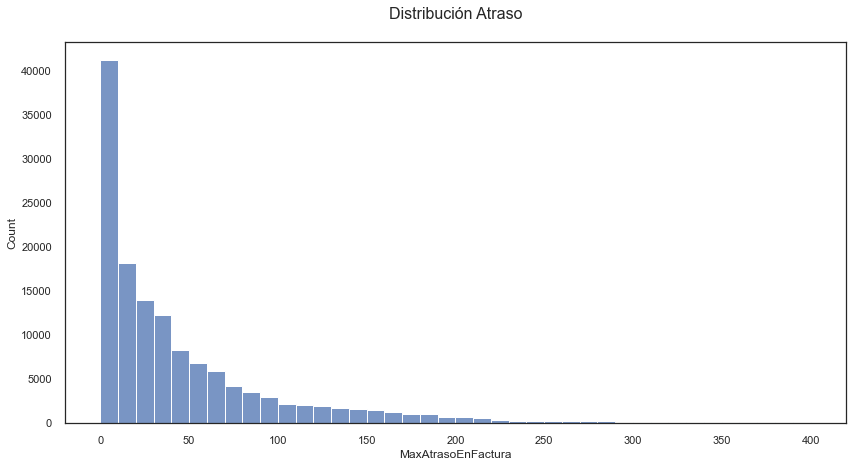

In [ ]:
# Examinamos la variable target 
print(data['MaxAtrasoEnFactura'].value_counts())
data['MaxAtrasoEnFactura'].describe()
distribution_plotter(data['MaxAtrasoEnFactura'],'Atraso',binrange=400,bin_width=10)

In [ ]:
# Creamos una función para binarizar la variable target (a modo de prueba se dejan tres valores posibles)

def binarize_credit_target(df_column):
  df_column_binarized = []

  for value in df_column:
    if (0 <= value < 30):
      df_column_binarized.append('0 - 29')
    elif (30 <= value < 90):
      df_column_binarized.append('30 - 89')
    #elif (90 <= value < 120):
     # df_column_binarized.append('90 - 119')
    #elif (90 <= value < 120):
    #  df_column_binarized.append('90 - 119')
    else:
      df_column_binarized.append('90 - 574')  

  return df_column_binarized

# Binarizamos la variable target
data['MaxAtrasoEnFactura'] = binarize_credit_target(data['MaxAtrasoEnFactura'])

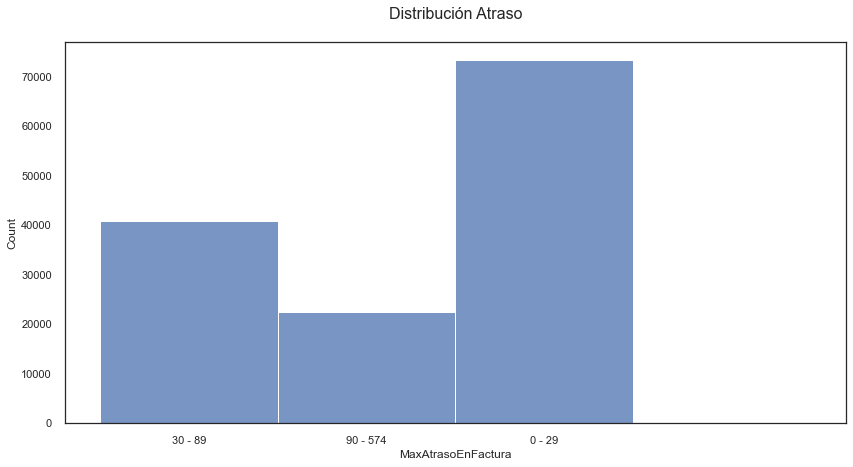

In [ ]:
# Visualización luego de discretizar
distribution_plotter(data['MaxAtrasoEnFactura'], 'Atraso',binrange=3,bin_width=2)

In [ ]:
#Analicemos proporciones de la target
data['MaxAtrasoEnFactura'].value_counts()/data.shape[0]

0 - 29      0.536315
30 - 89     0.298983
90 - 574    0.164702
Name: MaxAtrasoEnFactura, dtype: float64

In [ ]:
# Realizamos un sampleo estratificado del conjunto de datos

X = data.loc[:, data.columns != 'MaxAtrasoEnFactura']
Y = data['MaxAtrasoEnFactura']
Xrest, XSample, Yrest, YSample = train_test_split(X,Y,stratify = Y, shuffle=True, test_size=.20, random_state=10)
Data_sample = pd.concat([XSample, YSample], axis=1)
Data_sample['MaxAtrasoEnFactura'].value_counts()/Data_sample.shape[0]

0 - 29      0.536308
30 - 89     0.298990
90 - 574    0.164702
Name: MaxAtrasoEnFactura, dtype: float64

In [ ]:
Data_sample.shape

(27322, 28)

In [ ]:
# Realizamos un Recursive Feature Elimination con Cross-Validation (RFECV) para seleccionar las variables más importantes utilizando un modelo de Gradient Boosting Classifier

# Seleccionamos únicamente columnas numéricas
XSample_numeric_df = XSample.select_dtypes(include=np.number)

# Creamos un clasificador de Gradient Boosting
gb_model = GradientBoostingClassifier()

# Estandarizamos, creamos un RFECV y entrenamos
scaler = StandardScaler()    
XSample_numeric_df_scl = scaler.fit_transform(XSample_numeric_df)
rfe = RFECV(gb_model, step=1, cv=5)
rfe.fit(XSample_numeric_df_scl,YSample)

# Obtenemos las columnas que deberíamos mantener/descartar
scores = pd.DataFrame()
scores["Attribute Name"] = XSample_numeric_df.columns; scores["Ranking"] = rfe.ranking_; scores["Support"] = rfe.support_

print(scores.sort_values('Ranking'))


        Attribute Name  Ranking  Support
0   ANTIGUEDAD_LABORAL        1     True
1          CANT_OBS_BA        1     True
3       LIM_SOLA_FIRMA        1     True
4            MAX_ENDEU        1     True
5             MONTO_OP        1     True
6       OTROS_CREDITOS        1     True
7       MONTO_ADELANTO        1     True
8         SALDO_MOROSO        1     True
9     DIAS_MORA_ACTUAL        1     True
10               SALDO        1     True
11         CANT_CUOTAS        1     True
12         SCORE_VERAZ        1     True
13            Bin.Edad        1     True
14        RANGO_SUELDO        1     True
2          CANT_OBS_BC        2    False


In [ ]:
# En función del paso anterior eliminamos las features sugeridas
column_drop2=['CANT_OBS_BC']
Data_sample.drop(columns=column_drop2,inplace=True)

In [ ]:
Data_sample.shape

(27322, 27)

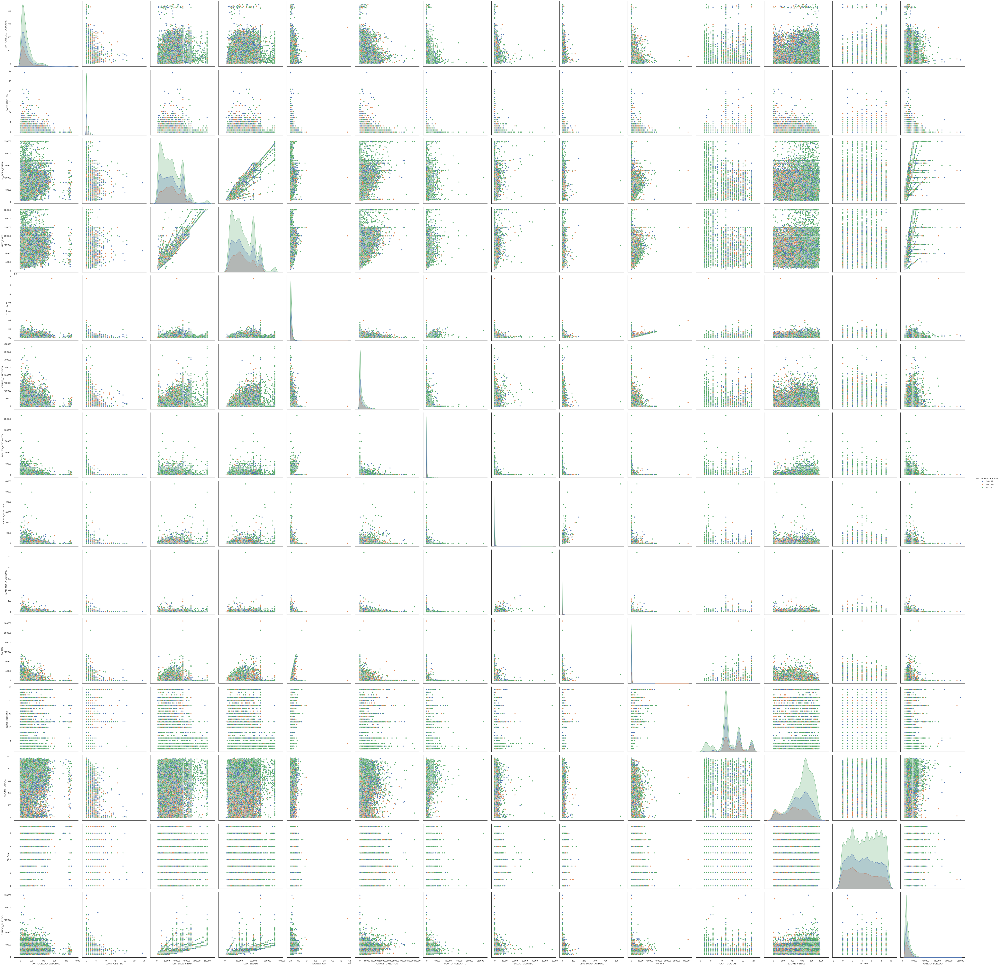

In [ ]:
sns.pairplot(Data_sample, hue='MaxAtrasoEnFactura', height=5);

## Modelado

In [ ]:
# Creo clase que contiene metodos que remueve duplicados, elimina tipos de datos incorrectos para el modelo y transforman a dummies las variables categoricas

class PreProcessingDataset():
  
  def __init__(self):
    pass

  def transform(self, df: pd.DataFrame, **transform_params):

    # Remuevo columnas de fechas (Los modelos no son compatibles con este tipo de datos)
    datetime_variables = df.select_dtypes(include=['datetime64[ns]'])
    df = df.drop(datetime_variables, axis=1)

    # Remuevo duplicados
    df = df.drop_duplicates()

    # Llamo a funcion que pasa de categoricas a dummies
    df = self.categorical_to_dummies(df)
    
    return df

  def categorical_to_dummies(self, X):
    # Paso variables categoricas a dummies (salvo variable target) y borro estas primeras
    categorial_variables = X.select_dtypes(include=['object'])
    categorial_variables.drop('MaxAtrasoEnFactura', axis=1, inplace=True)

    if not categorial_variables.empty:
      categorical_dummies = pd.get_dummies(categorial_variables, drop_first=True)
      X = X.drop(list(categorial_variables.columns), axis=1)
      return pd.concat([X, categorical_dummies], axis=1)

    return X

  def fit(self, y=None, **fit_params):
    return self

In [ ]:
# Creo clase que entrena un Grid Search con Cross Validation, obtiene el mejor parametro, entrena el modelo final y me devuelve todas las metricas del mejor resultado para el modelo

class GridSearchCrossValidation():
  
  def __init__(self, model, hyperparams):
    self.model = model
    self.hyperparams = hyperparams
    
  def fit(self, y=None, **fit_params):
    return self

# Funcion para remover outliers
  def remove_outliers(self, df):
    # Borro outliers del dataset
    constrains = df.select_dtypes(include=['int64', 'float64']).apply(lambda x: np.abs(stats.zscore(x)) < 3).all(axis=1)
    df = df.drop(df.index[~constrains])
    return df

# Funcion para aplicar SMOTE, balanceo de features
  def fix_imbalance(self, X, y):
    # Arreglo problema de balanceo de clases
    X_resampled, y_resampled = SMOTE(random_state=10).fit_resample(X, y)

    X_resampled = pd.DataFrame(X_resampled)
    X_resampled.columns = X.columns
        
    return X_resampled, y_resampled

  def transform(self, df: pd.DataFrame, **fit_params):
    # Defino variable target a predecir
    target_column = 'MaxAtrasoEnFactura'

    # Hago una copia del conjunto de datos sin modificar para pasar al siguiente paso del pipeline
    df_original = df.copy()

    # Llamo funcion que remueve outliers del conjunto de datos
    df = self.remove_outliers(df)

    # Separo en training y testing
    X_train, X_test, y_train, y_test = train_test_split(df.loc[:, df.columns != target_column], df[target_column], stratify = df[target_column], shuffle=True, test_size=.10, random_state=10)

    # Obtengo variables numericas
    numeric_cols = X_train.select_dtypes(include=np.number).columns

    # Escalamos variables numericas
    sc = StandardScaler()

    X_train[numeric_cols] = sc.fit_transform(X_train[numeric_cols])
    X_test[numeric_cols] = sc.transform(X_test[numeric_cols])

    # Realizo Over-sampling utilizando SMOTE para las clases desbalanceadas producto de eliminar outliers
    X_train, y_train = self.fix_imbalance(X_train, y_train)
    print(y_train.value_counts()/y_train.shape[0])
    
    # Creo Folds estratificados
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=10)

    # Creo GridSearch con Cross validation pasandole el modelo, los hiperparametros y el score que sera su funcion de perdida
    model_cv = GridSearchCV(estimator = self.model(), 
                            param_grid = self.hyperparams, 
                            scoring = 'roc_auc_ovo_weighted', 
                            cv = cv, 
                            n_jobs = -1,
                            return_train_score = True)
    
    # Ajusto el modelo
    model_cv.fit(X_train, y_train)
    
    # Obtengo los resultados del entrenamiento
    cv_results = pd.DataFrame(model_cv.cv_results_)

    # Obtengo el mejor resultado que pondere tanto el score de entrenamiento como el de testeo
    idxmax = cv_results[['mean_train_score', 'mean_test_score']].sum(axis = 1,).idxmax()

    # Creo diccionario para guardar los hiperparametros con sus mejores valores
    optimal_hyperparameters = dict({})

    # Itero sobre los hiperparametros mas optimos y los guardo en el diccionario
    for hyperparameter in self.hyperparams.items():
      optimal_hyperparameters[hyperparameter[0]] = cv_results.loc[idxmax, f'param_{hyperparameter[0]}']

    # Creo el modelo final con los hiperparametros mas optimos
    final_model = self.model(**optimal_hyperparameters)

    # Ajusto el modelo final
    final_model.fit(X_train, y_train)

    # Predigo el dataset de testeo
    y_pred = final_model.predict(X_test)

    # Creo el explicador de la estimacion en el modelo
    explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(X_train), feature_names = X_train.columns, class_names = df[target_column].unique(), mode='classification') 

    print(f'                    METODO - {self.model.__name__}                    ')
    print('')

    print('Area bajo la curva:')
    print(roc_auc_score(y_test, final_model.predict_proba(X_test), multi_class = 'ovo'))
    print('')

    print('Matriz de confusion:')
    print(confusion_matrix(y_test, y_pred))
    print('')

    print('Grafica de Matriz de confusion')
    plot_confusion_matrix(final_model, X_test, y_test, values_format = '')  
    plt.show()

    print('Accuracy')
    print(accuracy_score(y_test, y_pred))
    print('')

    print('Precision')
    print(precision_score(y_test, y_pred, average='weighted'))
    print('')    

    print('Recall')
    print(recall_score(y_test, y_pred, average='weighted'))
    print('')     

    print('F1-Score')
    print(f1_score(y_test, y_pred, average='weighted'))
    print('')

    print('Explicacion de estimacion (LIME):')
    explainer.explain_instance(data_row = X_test.iloc[1], predict_fn = final_model.predict_proba).show_in_notebook(show_table=True)
    print('')


    return df_original

In [ ]:
# Defino hiperparametros que voy a optimizar para los diferentes modelos
GaussianNB_hyperparams = {}
MLPClassifier_hyperparams = {'hidden_layer_sizes':list(range(200,1500,200)), 'max_iter': list(range(5,10))}
knn_hyperparams = {'leaf_size': list(range(28,30)), 'n_neighbors': list(range(5,10))}
random_forest_hyperparams = {'max_depth': list(range(2,16)), 'min_samples_split': list(range(2,16))}
decision_tree_hyperparams = {'max_depth': list(range(2,16)), 'min_samples_split': list(range(2,16))}
ada_boosting_hyperparams = {'n_estimators': list(range(45,65)), 'learning_rate': list(np.arange(0.05,0.9,0.1))}
gradient_boosting_hyperparams = {'n_estimators': list(range(45,65)), 'learning_rate': list(np.arange(0.05,0.9,0.1))}

In [ ]:
# Creo pipeline con todos los steps (Entreno diversos modelos)

ml_pipeline = Pipeline(steps=[
                              ('preprocessing_dataset', PreProcessingDataset()),
                              ('MLP',GridSearchCrossValidation(MLPClassifier, MLPClassifier_hyperparams)),
                              ('naive-bayes',GridSearchCrossValidation(GaussianNB, GaussianNB_hyperparams)),
                              ('ada_boosting', GridSearchCrossValidation(AdaBoostClassifier, ada_boosting_hyperparams)),
                              ('gradient_boosting', GridSearchCrossValidation(GradientBoostingClassifier, gradient_boosting_hyperparams)),
                              ('decision_tree', GridSearchCrossValidation(DecisionTreeClassifier, decision_tree_hyperparams)),
                              ('random_forest', GridSearchCrossValidation(RandomForestClassifier, random_forest_hyperparams)),
                              ('knn', GridSearchCrossValidation(KNeighborsClassifier, knn_hyperparams))
])

90 - 574    0.333333
0 - 29      0.333333
30 - 89     0.333333
Name: MaxAtrasoEnFactura, dtype: float64
                    METODO - MLPClassifier                    

Area bajo la curva:
0.6562397653914138

Matriz de confusion:
[[828 304 123]
 [338 222 156]
 [112 113 159]]

Grafica de Matriz de confusion


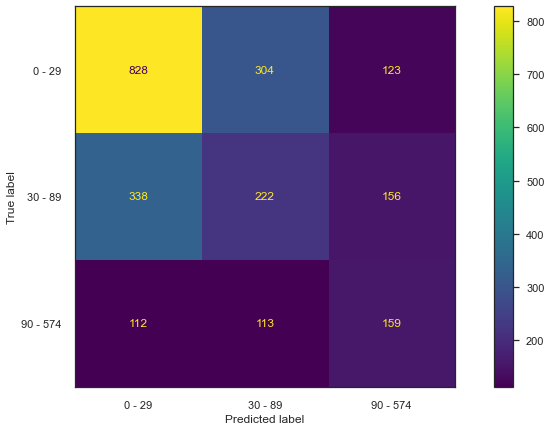

Accuracy
0.513375796178344

Precision
0.5100836626463646

Recall
0.513375796178344

F1-Score
0.5111048343957058

Explicacion de estimacion (LIME):



90 - 574    0.333333
0 - 29      0.333333
30 - 89     0.333333
Name: MaxAtrasoEnFactura, dtype: float64
                    METODO - GaussianNB                    

Area bajo la curva:
0.5970629325111102

Matriz de confusion:
[[741 122 392]
 [310  96 310]
 [128  50 206]]

Grafica de Matriz de confusion


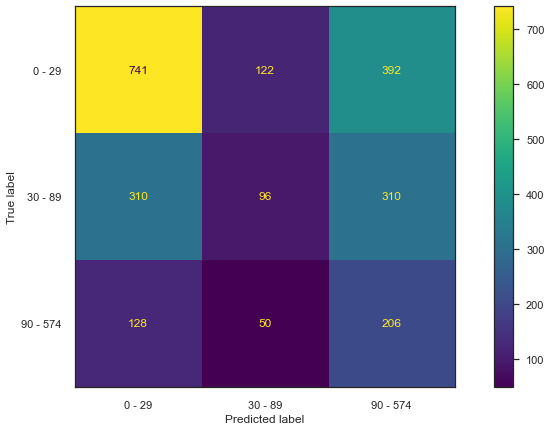

Accuracy
0.4428874734607219

Precision
0.4808333154902183

Recall
0.4428874734607219

F1-Score
0.4357947142827133

Explicacion de estimacion (LIME):



90 - 574    0.333333
0 - 29      0.333333
30 - 89     0.333333
Name: MaxAtrasoEnFactura, dtype: float64
                    METODO - AdaBoostClassifier                    

Area bajo la curva:
0.6658651710855213

Matriz de confusion:
[[792 329 134]
 [301 264 151]
 [ 90 127 167]]

Grafica de Matriz de confusion


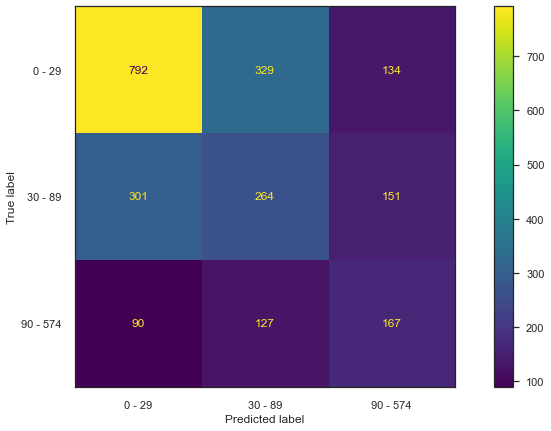

Accuracy
0.5193205944798301

Precision
0.5284977976972617

Recall
0.5193205944798301

F1-Score
0.5231722104274956

Explicacion de estimacion (LIME):



90 - 574    0.333333
0 - 29      0.333333
30 - 89     0.333333
Name: MaxAtrasoEnFactura, dtype: float64
                    METODO - GradientBoostingClassifier                    

Area bajo la curva:
0.6800306914605697

Matriz de confusion:
[[966 209  80]
 [414 198 104]
 [147 101 136]]

Grafica de Matriz de confusion


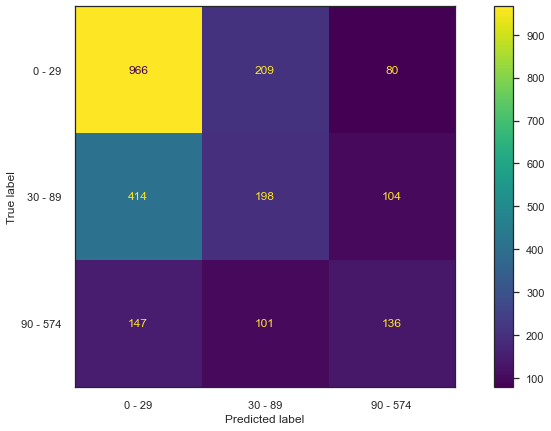

Accuracy
0.5520169851380042

Precision
0.5249257491406418

Recall
0.5520169851380042

F1-Score
0.5314494840215909

Explicacion de estimacion (LIME):



90 - 574    0.333333
0 - 29      0.333333
30 - 89     0.333333
Name: MaxAtrasoEnFactura, dtype: float64
                    METODO - DecisionTreeClassifier                    

Area bajo la curva:
0.6029212337683716

Matriz de confusion:
[[861 258 136]
 [386 196 134]
 [139 120 125]]

Grafica de Matriz de confusion


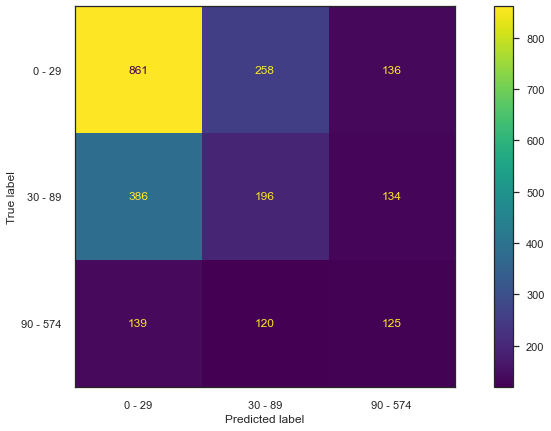

Accuracy
0.5019108280254777

Precision
0.48646624388154264

Recall
0.5019108280254777

F1-Score
0.4921878657646491

Explicacion de estimacion (LIME):



90 - 574    0.333333
0 - 29      0.333333
30 - 89     0.333333
Name: MaxAtrasoEnFactura, dtype: float64
                    METODO - RandomForestClassifier                    

Area bajo la curva:
0.6813363177102268

Matriz de confusion:
[[976 159 120]
 [422 152 142]
 [123  99 162]]

Grafica de Matriz de confusion


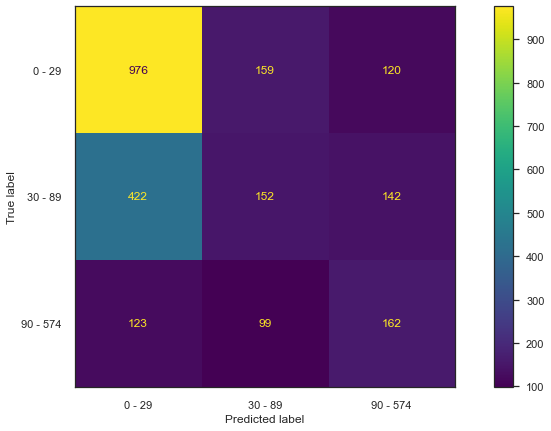

Accuracy
0.5477707006369427

Precision
0.5169737486684346

Recall
0.5477707006369427

F1-Score
0.5221935739289084

Explicacion de estimacion (LIME):



90 - 574    0.333333
0 - 29      0.333333
30 - 89     0.333333
Name: MaxAtrasoEnFactura, dtype: float64
                    METODO - KNeighborsClassifier                    

Area bajo la curva:
0.5830245893076514

Matriz de confusion:
[[577 443 235]
 [260 286 170]
 [117 132 135]]

Grafica de Matriz de confusion


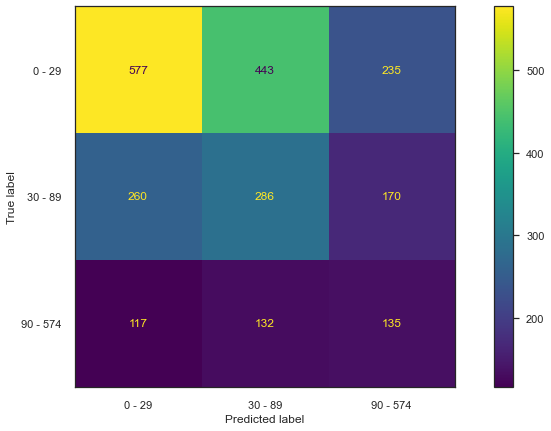

Accuracy
0.4237791932059448

Precision
0.4640706743851594

Recall
0.4237791932059448

F1-Score
0.436319948957661

Explicacion de estimacion (LIME):


,ANTIGUEDAD_LABORAL,CANT_OBS_BA,LIM_SOLA_FIRMA,MAX_ENDEU,MONTO_OP,OTROS_CREDITOS,MONTO_ADELANTO,SALDO_MOROSO,DIAS_MORA_ACTUAL,SALDO,...,Provincia_Entre Rios,Provincia_Formosa,Provincia_Jujuy,Provincia_La Rioja,Provincia_Misiones,Provincia_Salta,Provincia_San Luis,Provincia_Santa Fe,Provincia_Santiago del Estero,Provincia_Tucumán
40489,181.0,1,130000.00,250000.00,123735.98,0.00,0.0,0.0,0,0.00,...,0,0,0,0,0,0,0,0,0,0
111407,134.0,0,67374.00,112290.00,98409.02,0.00,40000.0,0.0,0,0.00,...,0,0,0,0,0,0,0,0,0,0
25050,143.0,2,119832.00,199720.00,43466.74,15751.58,0.0,0.0,0,0.00,...,0,1,0,0,0,0,0,0,0,0
47423,163.0,3,130000.00,198720.00,29877.79,0.00,0.0,0.0,0,0.00,...,0,0,0,0,0,0,0,0,0,0
128739,102.0,0,59020.50,85848.00,24743.35,48000.90,0.0,0.0,0,0.00,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97113,45.0,1,13266.00,29848.50,6702.80,2224.96,0.0,0.0,0,0.00,...,0,0,0,0,0,0,0,0,0,0
29247,7.0,0,82627.80,137713.00,23124.11,0.00,0.0,0.0,0,13485.85,...,0,0,0,0,0,0,0,0,0,0
93743,155.0,1,160000.00,250000.00,24985.96,60476.92,5000.0,0.0,0,0.00,...,0,0,0,0,1,0,0,0,0,0
129607,15.0,0,72473.24,112333.52,8780.47,53895.12,0.0,0.0,0,0.00,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Ejecuto pipeline

ml_pipeline.transform(Data_sample)